In [141]:
## BEAMMAP Class codebase: going from the time domain to the position/map domain
from IPython.display import display, HTML
display(HTML("<style>.container { width:99% !important; }</style>"))

from matplotlib.pyplot import *
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
from matplotlib.ticker import MultipleLocator
import numpy as np
import h5py
import hdf5plugin
import os
import glob
from matplotlib import colors
import pandas
import csv
import datetime
import pytz
import bisect
import pygeodesy
import yaml
from scipy.signal import square
from scipy.stats import pearsonr
import glob
import pickle

## Import packages from our own module:
from beamcals import corr
from beamcals import drone
from beamcals import bicolog
from beamcals import concat
from beamcals import beammap
import beamcals.plotting_utils as pu
import beamcals.fitting_utils as fu
import beamcals.geometry_utils as gu
import beamcals.time_utils as tu
from beamcals.sites import site

d3asite=site.site('../beamcals/beamcals/sites/D3A_3m_config.npz')
gbosite=site.site('../beamcals/beamcals/sites/GBO_config.npz')

from scipy.stats import binned_statistic_2d

In [90]:
with open('/hirax/GBO_Analysis_Outputs/flight_pickles/'+'FLY618_20211021T183430Z_ver_20231012T003521_concat.pkl', "rb") as f:
    CONCATCLASS=pickle.load(f)

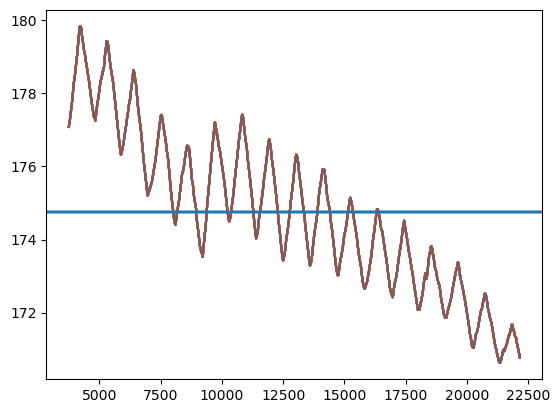

In [91]:
for k in range(16):
    plot(CONCATCLASS.drone_xyz_per_dish_interp[k,:,2])
    axhline(np.nanmean(CONCATCLASS.drone_xyz_per_dish_interp[:,:,2]))

In [140]:
(10**-.05)-1
20*np.log10(np.sqrt(.11))

-9.58607314841775

In [92]:
vtc=np.vstack((testbeam.x_edges[:,0],testbeam.y_edges[:,0],testbeam.z_edges[:,0])).T
vtp=np.array([gu.xyz_to_rpt(vtc[k]) for k in range(len(vtc))])

In [142]:
vtc=np.vstack((testbeam.x_edges_grid[:,:,0].flatten(),testbeam.y_edges_grid[:,:,0].flatten(),testbeam.z_edges_grid[:,:,0].flatten())).T
vtp=np.array([gu.xyz_to_rpt(vtc[k]) for k in range(len(vtc))])
vtcd=CONCATCLASS.drone_xyz_per_dish_interp[0,:,:]
vtpd=np.array([gu.xyz_to_rpt(vtcd[k]) for k in range(len(vtcd))])


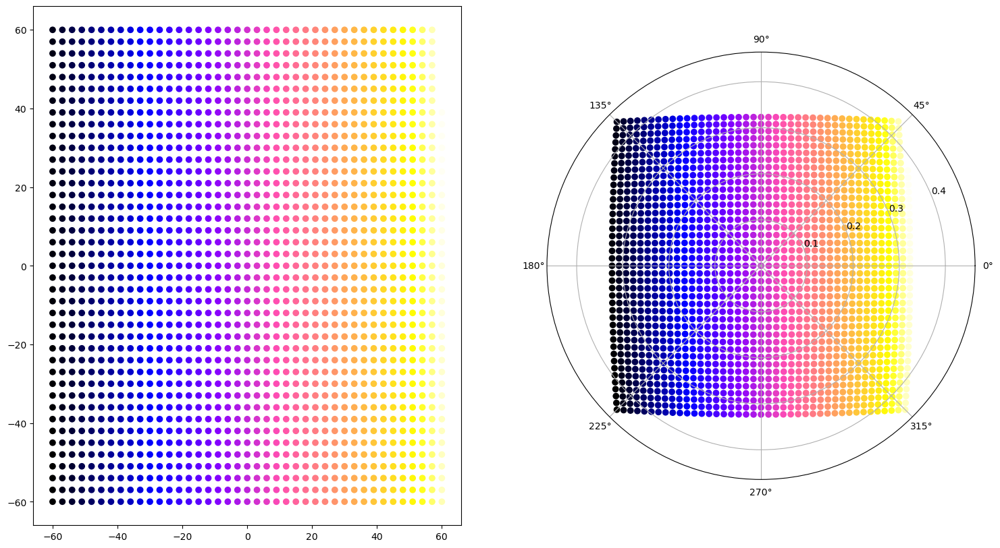

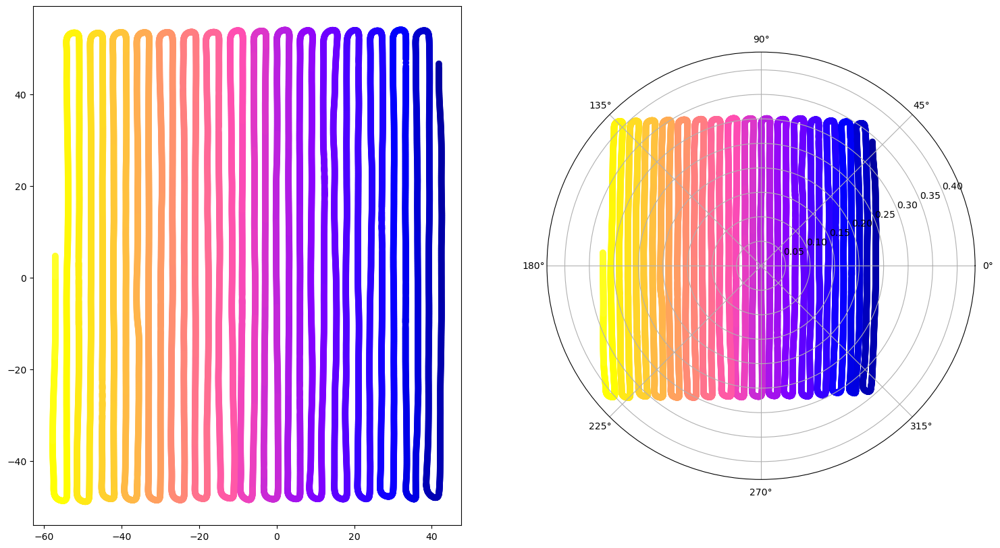

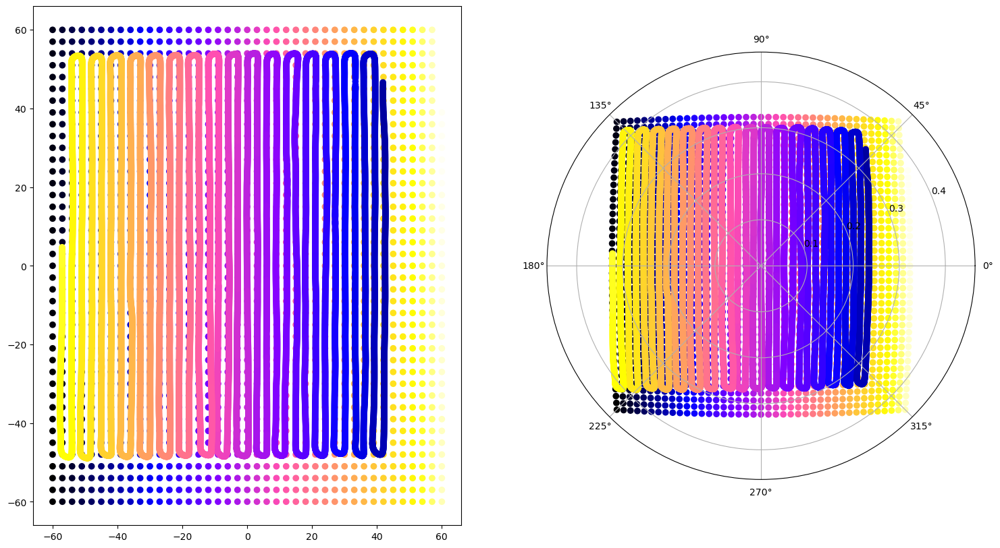

In [144]:
colorsarr=cm.gnuplot2(np.linspace(0,1,len(vtc)))
fig=figure(figsize=(18,10))
ax1=fig.add_subplot(121)
ax1.scatter(vtc[:,0],vtc[:,1],c=colorsarr)
ax2=fig.add_subplot(122,projection='polar')
ax2.scatter(vtp[:,1],vtp[:,2],c=colorsarr)

colorsarr=cm.gnuplot2(np.linspace(0,1,len(vtcd)))
fig=figure(figsize=(18,10))
ax1=fig.add_subplot(121)
ax1.scatter(vtcd[:,0],vtcd[:,1],c=colorsarr)
ax2=fig.add_subplot(122,projection='polar')
ax2.scatter(vtpd[:,1],vtpd[:,2],c=colorsarr)

fig=figure(figsize=(18,10))
ax1=fig.add_subplot(121)
ax2=fig.add_subplot(122,projection='polar')
colorsarr=cm.gnuplot2(np.linspace(0,1,len(vtc)))
ax1.scatter(vtc[:,0],vtc[:,1],c=colorsarr)
ax2.scatter(vtp[:,1],vtp[:,2],c=colorsarr)
colorsarr=cm.gnuplot2(np.linspace(0,1,len(vtcd)))
ax1.scatter(vtcd[:,0],vtcd[:,1],c=colorsarr)
ax2.scatter(vtpd[:,1],vtpd[:,2],c=colorsarr)

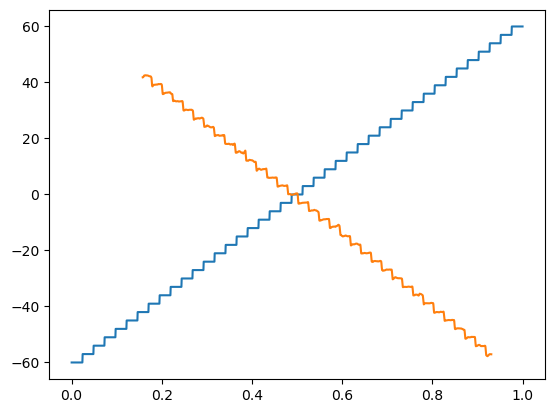

In [100]:
np.zeros()


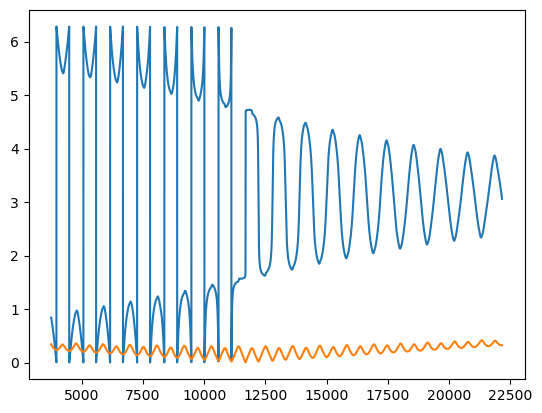

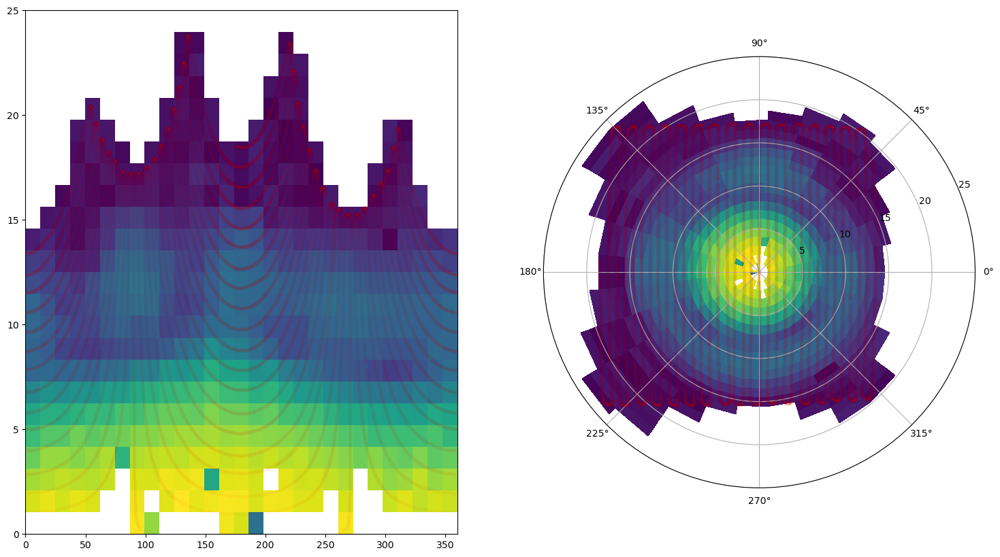

In [267]:
theta_arr=(np.linspace(0,360,30)*(np.pi/180.0))
phi_arr=np.linspace(0,25,25)*(np.pi/180.0)
theta_grid,phi_grid=np.meshgrid(theta_arr,phi_arr)

#plot(vtpd[:,0]) #r
#plot(vtpd[:,1]) #theta
#plot(vtpd[:,2]) #phi

polhist=binned_statistic_2d(x=vtpd[:,1],y=vtpd[:,2],values=CONCATCLASS.V_bgsub[:,900,1],statistic='std',bins=[theta_arr,phi_arr]).statistic
polhist.shape

fig=figure(figsize=(18,10))
ax1=fig.add_subplot(121)
ax1.pcolormesh(theta_grid/(np.pi/180.0),phi_grid/(np.pi/180.0),polhist.T,norm=LogNorm())
ax1.plot(vtpd[:,1]/(np.pi/180.0),vtpd[:,2]/(np.pi/180.0),'r.',alpha=0.02)
ax2=fig.add_subplot(122,projection='polar')
ax2.pcolormesh(theta_grid,phi_grid/(np.pi/180.0),polhist.T,norm=LogNorm())
ax2.plot(vtpd[:,1],vtpd[:,2]/(np.pi/180.0),'r.',alpha=0.02)

In [273]:
theta_arr=(np.linspace(0,360,30)*(np.pi/180.0))
phi_arr=np.linspace(0,25,25)*(np.pi/180.0)

In [281]:
d0args=[0,360,10]
d1args=[0,25,1]
(cedges(d0args)[:-1]+d0args[2]/2.0,cedges(d1args)[:-1]+d1args[2]/2.0)

(array([  5.,  15.,  25.,  35.,  45.,  55.,  65.,  75.,  85.,  95., 105.,
        115., 125., 135., 145., 155., 165., 175., 185., 195., 205., 215.,
        225., 235., 245., 255., 265., 275., 285., 295., 305., 315., 325.,
        335., 345., 355.]),
 array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5,
        22.5, 23.5, 24.5]))

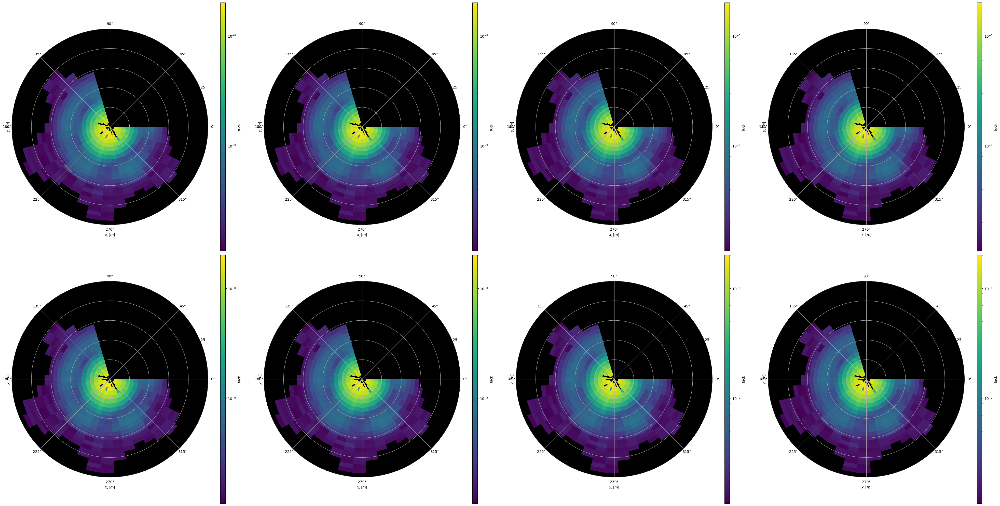

In [366]:
fig1=figure(figsize=(40,20))
ax11=fig1.add_subplot(241,projection='polar')
ax12=fig1.add_subplot(242,projection='polar')
ax13=fig1.add_subplot(243,projection='polar')
ax14=fig1.add_subplot(244,projection='polar')
ax15=fig1.add_subplot(245,projection='polar')
ax16=fig1.add_subplot(246,projection='polar')
ax17=fig1.add_subplot(247,projection='polar')
ax18=fig1.add_subplot(248,projection='polar')
axes=[[ax11,ax12,ax13,ax14],[ax15,ax16,ax17,ax18]]
im1=ax11.pcolormesh(theta_grid/(np.pi/180.0),phi_grid/(np.pi/180.0),polhist.T,norm=LogNorm())
im2=ax12.pcolormesh(theta_grid/(np.pi/180.0),phi_grid/(np.pi/180.0),polhist.T,norm=LogNorm())
im3=ax13.pcolormesh(theta_grid/(np.pi/180.0),phi_grid/(np.pi/180.0),polhist.T,norm=LogNorm())
im4=ax14.pcolormesh(theta_grid/(np.pi/180.0),phi_grid/(np.pi/180.0),polhist.T,norm=LogNorm())
im5=ax15.pcolormesh(theta_grid/(np.pi/180.0),phi_grid/(np.pi/180.0),polhist.T,norm=LogNorm())
im6=ax16.pcolormesh(theta_grid/(np.pi/180.0),phi_grid/(np.pi/180.0),polhist.T,norm=LogNorm())
im7=ax17.pcolormesh(theta_grid/(np.pi/180.0),phi_grid/(np.pi/180.0),polhist.T,norm=LogNorm())
im8=ax18.pcolormesh(theta_grid/(np.pi/180.0),phi_grid/(np.pi/180.0),polhist.T,norm=LogNorm())
images=[im1,im2,im3,im4,im5,im6,im7,im8]
cbarlabels=['fuck','fuck','fuck','fuck','fuck','fuck','fuck','fuck',]
for i in range(2):
    ax1,ax2,ax3,ax4=axes[i]
    for j,ax in enumerate([ax1,ax2,ax3,ax4]):
        ax.set_facecolor('k')
        ax.set_xlabel('$x,[m]$')
        ax.set_ylabel('$y, [m]$')
        cbar=fig1.colorbar(images[j],ax=ax,aspect=50)
        cbar.set_label(cbarlabels[j])
tight_layout()



In [367]:
#  _                                                             
# | |                                                            
# | |__   ___  __ _ _ __ ___  _ __ ___   __ _ _ __   _ __  _   _ 
# | '_ \ / _ \/ _` | '_ ` _ \| '_ ` _ \ / _` | '_ \ | '_ \| | | |
# | |_) |  __/ (_| | | | | | | | | | | | (_| | |_) || |_) | |_| |
# |_.__/ \___|\__,_|_| |_| |_|_| |_| |_|\__,_| .__(_) .__/ \__, |
#                                            | |    | |     __/ |
#                                            |_|    |_|    |___/ 
        
## 20230411_WT: introducing class and adding it to the package....

## Class for position-space sorting/averaging of beammap flight data, from time domain data:

from matplotlib.pyplot import *
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
from matplotlib.ticker import MultipleLocator
import numpy as np
import h5py
import hdf5plugin
import os
import glob
from matplotlib import colors
import pandas
import csv
import datetime
import pytz
import bisect
import pygeodesy
import yaml
from scipy.signal import square
from scipy.stats import pearsonr
import glob
import pickle
from scipy.stats import binned_statistic_2d
from scipy.interpolate import griddata
import pykrige.kriging_tools as kt
from pykrige.ok import OrdinaryKriging

## Class for position-space sorting/averaging of beammap flight data, from time domain data:
#defines coordinate vector from xmax to xmin spaced roughly by xres:
def cedges(args):
    cmin,cmax,cres=args
    return np.linspace(cmin,cmax,int((cmax-cmin)/cres)+1)

class Beammap:
    def __init__(self,concatlist=[],gfitlist=[],ampcorrlist=[],\
                 coordsys='cartesian',d0args=[-100,100,5],d1args=[-100,100,5],\
                 #coordsys='polar',d0args=[0,360,10],d1args=[0,25,1],\
                 Fargs=[0,1024,1],f_index=900,\
                 operation='coadd',inputstyle='pickle',normalization='none',vplot=True,\
                 pickle_directory='/hirax/GBO_Analysis_Outputs/flight_pickles/',\
                 gfit_directory='/hirax/GBO_Analysis_Outputs/main_beam_fits/',\
                 flightmasterpath='/hirax/GBO_Analysis_Outputs/GBO_flights_forscripts.yaml',\
                 ampcorr_directory='/hirax/GBO_Analysis_Outputs/amplitude_corrections/',include_cross_data=False):
        ## enable format of input to be load from 'pickle' filestring or bin/map using concat 'class':        
        self.concat_list=concatlist
        self.gfit_list=gfitlist
        self.ampcorr_list=ampcorrlist      
        nchanslist=np.zeros(len(concatlist))
        if inputstyle=='pickle':
            for h,cstring in enumerate(concatlist):
                ## using the with loop structure, the pickle file is closed after ccc is loaded:
                with open(pickle_directory+cstring, "rb") as f:
                    CONCATCLASS=pickle.load(f)
                nchanslist[h]=CONCATCLASS.n_channels
                self.FLYNUM=cstring.split('FLY')[1].split('_')[0]
        elif inputstyle=='class':
            CONCATCLASS=concatlist[0]
            for h,cstring in enumerate(concatlist):
                nchanslist[h]=cstring.n_channels
                self.FLYNUM=cstring.FLYTAG.split('FLY')[1].split('.')[0]
        ## determine which channel is co-pol, for frequency dependent centroid corrections:
        with open(flightmasterpath, 'r') as flightmaster:
            doccs = yaml.safe_load(flightmaster)
            for j,fstr in enumerate(doccs['flight_info']['flights']):
                if self.FLYNUM in fstr:
                    self.copoldir=doccs['flight_info']['pols'][j]
        #get variables that should be kept along from the first concat class:         
        self.name=CONCATCLASS.name
        self.Data_Directory=CONCATCLASS.Data_Directory
        self.Gain_Directory=CONCATCLASS.Gain_Directory
        self.filenames=CONCATCLASS.filenames
        self.gainfile=CONCATCLASS.gainfile
        self.Drone_Directory=CONCATCLASS.Drone_Directory
        self.FLYTAG=CONCATCLASS.FLYTAG
        self.n_dishes=CONCATCLASS.n_dishes
        self.n_channels=int(np.nanmin(nchanslist))
        self.n_concats=len(concatlist)
        self.chmap=CONCATCLASS.chmap
        self.automap=CONCATCLASS.automap
        self.crossmap=CONCATCLASS.crossmap
        self.origin=CONCATCLASS.origin
        #self.prime_origin=CONCATCLASS.prime_origin ## omit, it breaks the pickle
        self.dish_keystrings=CONCATCLASS.dish_keystrings
        self.dish_coords=CONCATCLASS.dish_coords
        self.dish_pointings=CONCATCLASS.dish_pointings
        self.dish_polarizations=CONCATCLASS.dish_polarizations
        self.fmin,self.fmax,self.fstep=Fargs
        self.faxis=np.arange(self.fmin,self.fmax,self.fstep)
        self.n_freqs=len(self.faxis)
        self.freq=CONCATCLASS.freq[self.faxis]
        find=np.where(self.faxis==f_index)[0][0]
        self.operation=operation
        ## Determine Coordinate System: coordsys='cartesian' or 'polar':
        if coordsys=='cartesian':
            Xargs=d0args
            Yargs=d1args
            #create x,y cartesian vectors (edges and centers) and grids for the beammap:
            xedges,yedges=(cedges(Xargs),cedges(Yargs))
            xedgesgrid,yedgesgrid=np.meshgrid(xedges,yedges,indexing='ij')
            xcenters,ycenters=(cedges(Xargs)[:-1]+Xargs[2]/2.0,cedges(Yargs)[:-1]+Yargs[2]/2.0)
            xcentersgrid,ycentersgrid=np.meshgrid(xcenters,ycenters,indexing='ij')        
            #need to extend this to dimensionality of channels in concatclass.V
            self.d0_edges=np.zeros(xedges.shape+(self.n_channels,))
            self.d1_edges=np.zeros(yedges.shape+(self.n_channels,))
            self.d0_edges_grid=np.zeros((xedgesgrid.shape+(self.n_channels,)))
            self.d1_edges_grid=np.zeros((yedgesgrid.shape+(self.n_channels,)))
            self.d0_centers=np.zeros(xcenters.shape+(self.n_channels,))
            self.d1_centers=np.zeros(ycenters.shape+(self.n_channels,))
            self.d0_centers_grid=np.zeros((xcentersgrid.shape+(self.n_channels,)))
            self.d1_centers_grid=np.zeros((ycentersgrid.shape+(self.n_channels,)))
            for i in range(self.n_channels):
                self.d0_edges[:,i]=xedges
                self.d0_centers[:,i]=xcenters
                self.d1_edges[:,i]=yedges
                self.d1_centers[:,i]=ycenters
                self.d0_centers_grid[:,:,i]=xcentersgrid
                self.d1_centers_grid[:,:,i]=ycentersgrid
                self.d0_edges_grid[:,:,i]=xedgesgrid
                self.d1_edges_grid[:,:,i]=yedgesgrid
        if coordsys=='polar':
            theta_args=d0args
            phi_args=d1args
            #create x,y cartesian vectors (edges and centers) and grids for the beammap:
            thetaedges,phiedges=(cedges(theta_args),cedges(phi_args))
            thetaedgesgrid,phiedgesgrid=np.meshgrid(thetaedges,phiedges,indexing='ij')
            thetacenters,phicenters=(cedges(theta_args)[:-1]+theta_args[2]/2.0,cedges(phi_args)[:-1]+phi_args[2]/2.0)
            thetacentersgrid,phicentersgrid=np.meshgrid(thetacenters,phicenters,indexing='ij')        
            #need to extend this to dimensionality of channels in concatclass.V
            self.d0_edges=np.zeros(thetaedges.shape+(self.n_channels,))
            self.d1_edges=np.zeros(phiedges.shape+(self.n_channels,))
            self.d0_edges_grid=np.zeros((thetaedgesgrid.shape+(self.n_channels,)))
            self.d1_edges_grid=np.zeros((phiedgesgrid.shape+(self.n_channels,)))
            self.d0_centers=np.zeros(thetacenters.shape+(self.n_channels,))
            self.d1_centers=np.zeros(phicenters.shape+(self.n_channels,))
            self.d0_centers_grid=np.zeros((thetacentersgrid.shape+(self.n_channels,)))
            self.d1_centers_grid=np.zeros((phicentersgrid.shape+(self.n_channels,)))
            for i in range(self.n_channels):
                self.d0_edges[:,i]=thetaedges
                self.d0_centers[:,i]=thetacenters
                self.d1_edges[:,i]=phiedges
                self.d1_centers[:,i]=phicenters
                self.d0_centers_grid[:,:,i]=thetacentersgrid
                self.d1_centers_grid[:,:,i]=phicentersgrid
                self.d0_edges_grid[:,:,i]=thetaedgesgrid
                self.d1_edges_grid[:,:,i]=phiedgesgrid    
        ## now need frequency dependent offset terms in shape (freq, channel, concat) to mimic V
        self.x_offsets=np.NAN*np.ones((len(self.freq),self.n_channels,self.n_concats))
        self.y_offsets=np.NAN*np.ones((len(self.freq),self.n_channels,self.n_concats))        
        ## create arrays for V mean, V std, and histo: shape is (gridx, gridy, freq, chans, concatlist)
        self.V_LC_mean=np.NAN*np.ones((len(self.d0_centers[:,0]),len(self.d1_centers[:,0]),len(self.freq),self.n_channels,self.n_concats))
        self.V_LC_std=np.NAN*np.ones((len(self.d0_centers[:,0]),len(self.d1_centers[:,0]),len(self.freq),self.n_channels,self.n_concats))
        self.histogram_LC=np.NAN*np.ones((len(self.d0_centers[:,0]),len(self.d1_centers[:,0]),len(self.freq),self.n_channels,self.n_concats))
        if include_cross_data==True:
            self.V_LC_cross=np.NAN*np.ones((len(self.d0_centers[:,0]),len(self.d1_centers[:,0]),len(self.freq),len(self.crossmap),self.n_concats))
            self.V_LC_cross=self.V_LC_cross.astype(complex) 
        ## Initialize Figure Environment for traceback plot:
        if vplot==True:
            if coordsys=='cartesian':
                fig0,axes0=subplots(nrows=2,ncols=4,figsize=(40,20)) 
            elif coordsys=='polar':
                fig0=figure(figsize=(40,20))
                ax01=fig0.add_subplot(241,projection='polar')
                ax02=fig0.add_subplot(242,projection='polar')
                ax03=fig0.add_subplot(243,projection='polar')
                ax04=fig0.add_subplot(244,projection='polar')
                ax05=fig0.add_subplot(245,projection='polar')
                ax06=fig0.add_subplot(246,projection='polar')
                ax07=fig0.add_subplot(247,projection='polar')
                ax08=fig0.add_subplot(248,projection='polar')
                axes0=[[ax01,ax02,ax03,ax04],[ax05,ax06,ax07,ax08]]
        ## loop through the concat classes (h,ccc=concatclass) and extract hist/V parameters:
        print("start of concat loop is: {}".format(datetime.datetime.now()))
        for h,cstring in enumerate(concatlist):
            ## create automatic verification plot axes:
            if vplot==True:
                if coordsys=='cartesian':
                    fig,axes=subplots(nrows=2,ncols=4,figsize=(40,20)) 
                elif coordsys=='polar':
                    fig1=figure(figsize=(40,20))
                    ax11=fig1.add_subplot(241,projection='polar')
                    ax12=fig1.add_subplot(242,projection='polar')
                    ax13=fig1.add_subplot(243,projection='polar')
                    ax14=fig1.add_subplot(244,projection='polar')
                    ax15=fig1.add_subplot(245,projection='polar')
                    ax16=fig1.add_subplot(246,projection='polar')
                    ax17=fig1.add_subplot(247,projection='polar')
                    ax18=fig1.add_subplot(248,projection='polar')
                    axes=[[ax11,ax12,ax13,ax14],[ax15,ax16,ax17,ax18]]
            ## using the with loop structure, the pickle file is closed after ccc is loaded:
            if inputstyle=='pickle':
                with open(pickle_directory+cstring, "rb") as f:
                    ccc=pickle.load(f)   
            elif inputstyle=='class':
                ccc=cstring
            t_cut=ccc.inds_on
            if normalization=='none':          
                if vplot==True:
                    if coordsys=='cartesian':
                        ch0coords=ccc.drone_xyz_per_dish_interp[0,t_cut,:]
                        ch1coords=ccc.drone_xyz_per_dish_interp[1,t_cut,:]
                    elif coordsys=='polar':
                        ch0coords=np.array([gu.xyz_to_rpt(ccc.drone_xyz_per_dish_interp[0,k,:]) for k in t_cut])[:,1:]
                        ch1coords=np.array([gu.xyz_to_rpt(ccc.drone_xyz_per_dish_interp[1,k,:]) for k in t_cut])[:,1:]
                    im1x=axes[0][0].scatter(ch0coords[:,0],ch0coords[:,1],c=ccc.V_bgsub[t_cut,f_index,0],cmap=cm.gnuplot2,norm=LogNorm())
                    im1y=axes[1][0].scatter(ch1coords[:,0],ch1coords[:,1],c=ccc.V_bgsub[t_cut,f_index,1],cmap=cm.gnuplot2,norm=LogNorm())    
                    im1x0=axes0[0][0].scatter(ch0coords[:,0],ch0coords[:,1],c=ccc.V_bgsub[t_cut,f_index,0],cmap=cm.gnuplot2,norm=LogNorm())
                    im1y0=axes0[1][0].scatter(ch1coords[:,0],ch1coords[:,1],c=ccc.V_bgsub[t_cut,f_index,1],cmap=cm.gnuplot2,norm=LogNorm())    
                else:
                    pass
            elif normalization=='Gauss':
                if len(gfitlist)==len(concatlist):
                    ## make sure the normalization is being appropriately applied to the correct file:
                    if concatlist[h].split('_')[0]==gfitlist[h].split('_')[0]:
                        with np.load(gfit_directory+gfitlist[h]) as gff:
                            g_norm=gff['G_popt'][:,:,0]
                            for i in range(self.n_channels):
                                if self.copoldir in 'E':
                                    COPOLIND=np.arange(self.n_channels).reshape(int(self.n_channels/2),2)[int(i/2)][0]
                                    self.x_offsets[:,i,h]=gff['G_popt'][COPOLIND,self.faxis,1]-ccc.dish_coords[i][0] # seems like gauss params were found with original xyz, so remove dish offset
                                    self.y_offsets[:,i,h]=gff['G_popt'][COPOLIND,self.faxis,3]-ccc.dish_coords[i][1] # seems like gauss params were found with original xyz, so remove dish offset
                                elif self.copoldir in 'N':
                                    COPOLIND=np.arange(self.n_channels).reshape(int(self.n_channels/2),2)[int(i/2)][1]
                                    self.x_offsets[:,i,h]=gff['G_popt'][COPOLIND,self.faxis,1]-ccc.dish_coords[i][0] # seems like gauss params were found with original xyz, so remove dish offset
                                    self.y_offsets[:,i,h]=gff['G_popt'][COPOLIND,self.faxis,3]-ccc.dish_coords[i][1] # seems like gauss params were found with original xyz, so remove dish offset
                                else:
                                    print('your loop sucks idiot')                                 
                            if vplot==True:
                                if coordsys=='cartesian':
                                    ch0coords=ccc.drone_xyz_per_dish_interp[0,t_cut,:]+np.array([self.x_offsets[find,i,h],self.y_offsets[find,i,h],0.0])
                                    ch1coords=ccc.drone_xyz_per_dish_interp[1,t_cut,:]+np.array([self.x_offsets[find,i,h],self.y_offsets[find,i,h],0.0])
                                elif coordsys=='polar':
                                    ch0coords=np.array([gu.xyz_to_rpt(ccc.drone_xyz_per_dish_interp[0,k,:]+np.array([self.x_offsets[find,i,h],self.y_offsets[find,i,h],0.0])) for k in t_cut])[:,1:]
                                    ch1coords=np.array([gu.xyz_to_rpt(ccc.drone_xyz_per_dish_interp[1,k,:]+np.array([self.x_offsets[find,i,h],self.y_offsets[find,i,h],0.0])) for k in t_cut])[:,1:]
                                im1x=axes[0][0].scatter(ch0coords[:,0],ch0coords[:,1],c=(1.0/g_norm[0,f_index])*ccc.V_bgsub[t_cut,f_index,0],cmap=cm.gnuplot2,norm=LogNorm())
                                im1y=axes[1][0].scatter(ch1coords[:,0],ch1coords[:,1],c=(1.0/g_norm[1,f_index])*ccc.V_bgsub[t_cut,f_index,1],cmap=cm.gnuplot2,norm=LogNorm())
                                im1x0=axes0[0][0].scatter(ch0coords[:,0],ch0coords[:,1],c=(1.0/g_norm[0,f_index])*ccc.V_bgsub[t_cut,f_index,0],cmap=cm.gnuplot2,norm=LogNorm())
                                im1y0=axes0[1][0].scatter(ch1coords[:,0],ch1coords[:,1],c=(1.0/g_norm[1,f_index])*ccc.V_bgsub[t_cut,f_index,1],cmap=cm.gnuplot2,norm=LogNorm())
                            else:
                                pass                                                        
            elif normalization=='Gauss_wcorr':
                if len(gfitlist)==len(concatlist) and len(ampcorrlist)==len(concatlist):
                    ## make sure the normalization is being appropriately applied to the correct file:
                    if concatlist[h].split('_')[0]==gfitlist[h].split('_')[0] and concatlist[h].split('_')[0]==ampcorrlist[h].split('_')[0]:
                        with np.load(gfit_directory+gfitlist[h]) as gff:
                            g_norm=gff['G_popt'][:,:,0]
                            for i in range(self.n_channels):
                                if self.copoldir in 'E':
                                    COPOLIND=np.arange(self.n_channels).reshape(int(self.n_channels/2),2)[int(i/2)][0]
                                    self.x_offsets[:,i,h]=gff['G_popt'][COPOLIND,self.faxis,1]-ccc.dish_coords[i][0] # seems like gauss params were found with original xyz, so remove dish offset
                                    self.y_offsets[:,i,h]=gff['G_popt'][COPOLIND,self.faxis,3]-ccc.dish_coords[i][1] # seems like gauss params were found with original xyz, so remove dish offset
                                elif self.copoldir in 'N':
                                    COPOLIND=np.arange(self.n_channels).reshape(int(self.n_channels/2),2)[int(i/2)][1]
                                    self.x_offsets[:,i,h]=gff['G_popt'][COPOLIND,self.faxis,1]-ccc.dish_coords[i][0] # seems like gauss params were found with original xyz, so remove dish offset
                                    self.y_offsets[:,i,h]=gff['G_popt'][COPOLIND,self.faxis,3]-ccc.dish_coords[i][1] # seems like gauss params were found with original xyz, so remove dish offset
                                else:
                                    print('your loop sucks idiot')                                 
                            if vplot==True:
                                if coordsys=='cartesian':
                                    ch0coords=ccc.drone_xyz_per_dish_interp[0,t_cut,:]+np.array([self.x_offsets[find,i,h],self.y_offsets[find,i,h],0.0])
                                    ch1coords=ccc.drone_xyz_per_dish_interp[1,t_cut,:]+np.array([self.x_offsets[find,i,h],self.y_offsets[find,i,h],0.0])
                                elif coordsys=='polar':
                                    ch0coords=np.array([gu.xyz_to_rpt(ccc.drone_xyz_per_dish_interp[0,k,:]+np.array(self.x_offsets[find,i,h],self.y_offsets[find,i,h],0.0)) for k in t_cut])[:,1:]
                                    ch1coords=np.array([gu.xyz_to_rpt(ccc.drone_xyz_per_dish_interp[1,k,:]+np.array(self.x_offsets[find,i,h],self.y_offsets[find,i,h],0.0)) for k in t_cut])[:,1:]
                                im1x=axes[0][0].scatter(ch0coords[:,0],ch0coords[:,1],c=(1.0/g_norm[0,f_index])*ccc.V_bgsub[t_cut,f_index,0],cmap=cm.gnuplot2,norm=LogNorm())
                                im1y=axes[1][0].scatter(ch1coords[:,0],ch1coords[:,1],c=(1.0/g_norm[1,f_index])*ccc.V_bgsub[t_cut,f_index,1],cmap=cm.gnuplot2,norm=LogNorm())
                                im1x0=axes0[0][0].scatter(ch0coords[:,0],ch0coords[:,1],c=(1.0/g_norm[0,f_index])*ccc.V_bgsub[t_cut,f_index,0],cmap=cm.gnuplot2,norm=LogNorm())
                                im1y0=axes0[1][0].scatter(ch1coords[:,0],ch1coords[:,1],c=(1.0/g_norm[1,f_index])*ccc.V_bgsub[t_cut,f_index,1],cmap=cm.gnuplot2,norm=LogNorm())                               
                            else:
                                pass
                        with open(ampcorr_directory+ampcorrlist[h],'rb') as acf:
                            print(ampcorr_directory+ampcorrlist[h])
                            gcorr_norm=pickle.load(acf)
            ## ATTEMPT TO BYPASS chan,freq LOOPS:
            ## create centroid-corrected per channel and frequency drone coordinate maps on a per-concat basis:
            tmpcoords=np.repeat(ccc.drone_xyz_per_dish_interp[:,:,:,np.newaxis],len(self.freq),axis=3)
            shiftvec=np.array((self.x_offsets[:,:,h],self.y_offsets[:,:,h],np.zeros(self.x_offsets[:,:,h].shape)))
            tmpshifts=np.repeat(np.swapaxes(np.swapaxes(shiftvec,0,2),1,2)[:,np.newaxis,:,:],len(ccc.t),axis=1)
            fccoords=(tmpcoords-tmpshifts)[:,ccc.inds_on]
            if normalization=='none':
                Vvals=ccc.V_bgsub[ccc.inds_on,:,:]
            elif normalization=='Gauss':
                Vvals=(np.repeat(np.swapaxes(g_norm[:,self.fmin:self.fmax:self.fstep],0,1)[np.newaxis,:,:],len(ccc.inds_on),axis=0)**-1)*ccc.V_bgsub[ccc.inds_on,self.fmin:self.fmax:self.fstep,:]           
            elif normalization=='Gauss_wcorr':    
                Vvals_gcorr=(np.repeat(np.swapaxes(g_norm[:,self.fmin:self.fmax:self.fstep],0,1)[np.newaxis,:,:],len(ccc.inds_on),axis=0)**-1)*ccc.V_bgsub[ccc.inds_on,self.fmin:self.fmax:self.fstep,:]      
                Vvals = Vvals_gcorr*gcorr_norm[self.faxis,:] 
            ## loop through channels (i,chan) to find indices of nonzero cells in histogram
            for i,chan in enumerate(range(self.n_channels)):
                for j,fr in enumerate(self.faxis):
                    print('autos: Concat:{}/{}, Channel:{}/{}, Frequency:{}/{},           '.format(h+1,self.n_concats,i+1,self.n_channels,j+1,len(self.freq)),end='\r')
                    if coordsys=='cartesian':
                        xf,yf=fccoords[i,:,0,j],fccoords[i,:,1,j]
                    elif coordsys=='polar':
                        polcoords=np.array([gu.xyz_to_rpt(fccoords[i,k,:,j]) for k in range(len(fccoords[i,:,:,j]))])
                        xf,yf=polcoords[:,1],polcoords[:,2]                      
                    valsf=Vvals[:,j,i]                        
                    #histo2d,xbins,ybins=np.histogram2d(x,y,bins=[self.x_edges[:,i],self.y_edges[:,i]])
                    self.histogram_LC[:,:,j,i,h]=binned_statistic_2d(x=xf,y=yf,values=valsf,statistic='count',bins=[self.d0_edges[:,i],self.d1_edges[:,i]]).statistic
                    self.V_LC_mean[:,:,j,i,h]=binned_statistic_2d(x=xf,y=yf,values=valsf,statistic='mean',bins=[self.d0_edges[:,i],self.d1_edges[:,i]]).statistic
                    self.V_LC_std[:,:,j,i,h]=binned_statistic_2d(x=xf,y=yf,values=valsf,statistic='std',bins=[self.d0_edges[:,i],self.d1_edges[:,i]]).statistic
            if include_cross_data==True:
                for i,cmind in enumerate(self.crossmap):
                    Vvals_cross=ccc.V_cross_bgsub[ccc.inds_on,:,:]
                    for j,fr in enumerate(self.faxis):
                        print('cross: Concat:{}/{}, Channel:{}/{}, Frequency:{}/{},           '.format(h+1,self.n_concats,i+1,len(self.crossmap),j+1,len(self.freq)),end='\r')
                        if coordsys=='cartesian':
                            xf,yf=fccoords[i,:,0,j],fccoords[i,:,1,j]
                        elif coordsys=='polar':
                            polcoords=np.array([gu.xyz_to_rpt(fccoords[i,k,:,j]) for k in range(len(fccoords[i,:,:,j]))])
                            xf,yf=polcoords[:,1],polcoords[:,2]
                        valsf_cross=Vvals_cross[:,j,i]  
                        realvals=binned_statistic_2d(x=xf,y=yf,values=np.real(valsf_cross),statistic='mean',bins=[self.d0_edges[:,i],self.d1_edges[:,i]]).statistic
                        imagvals=binned_statistic_2d(x=xf,y=yf,values=np.imag(valsf_cross),statistic='mean',bins=[self.d0_edges[:,i],self.d1_edges[:,i]]).statistic
                        self.V_LC_cross[:,:,j,i,h]=realvals+(1.0j*imagvals)                        
            if vplot==True:
                for i in range(2):
                    ax1,ax2,ax3,ax4=axes[i]
                    im2=ax2.pcolormesh(self.d0_edges_grid[:,:,i],self.d1_edges_grid[:,:,i],self.histogram_LC[:,:,find,i,h],cmap=cm.gnuplot2)
                    im2.set_clim(0,30)
                    im3=ax3.pcolormesh(self.d0_edges_grid[:,:,i],self.d1_edges_grid[:,:,i],self.V_LC_mean[:,:,find,i,h],cmap=cm.gnuplot2,norm=LogNorm())
                    im4=ax4.pcolormesh(self.d0_edges_grid[:,:,i],self.d1_edges_grid[:,:,i],self.V_LC_std[:,:,find,i,h],cmap=cm.gnuplot2,norm=LogNorm())
                    images=[[im1x,im1y][i],im2,im3,im4]
                    titles=['Unbinned Beammaps ({} CH{} {:.2f} MHz)'.format(self.concat_list[h].split('_')[0],i,self.freq[find]),\
                            'Histogram ({} CH{} {:.2f} MHz)'.format(self.concat_list[h].split('_')[0],i,self.freq[find]),\
                            r'Coadded $\bar{x}$'+' Map ({} CH{} {:.2f} MHz)'.format(self.concat_list[h].split('_')[0],i,self.freq[find]),\
                            'Coadded $\sigma$ Map ({} CH{} {:.2f} MHz)'.format(self.concat_list[h].split('_')[0],i,self.freq[find])]
                    cbarlabels=['Power [$ADU^2$]','Counts','Power [$ADU^2$]','Power [$ADU^2$]']
                    for j,ax in enumerate([ax1,ax2,ax3,ax4]):
                        ax.set_title(titles[j])
                        ax.set_facecolor('k')
                        if coordsys=='cartesian':
                            ax.set_xlabel('$x,[m]$')
                            ax.set_ylabel('$y, [m]$')
                            divider=make_axes_locatable(ax)
                            cax=divider.append_axes("right", size="3%", pad=0.05)
                            cbar=fig1.colorbar(images[j],cax=cax)
                        if coordsys=='polar':
                            cbar=fig1.colorbar(images[j],ax=ax,aspect=50)
                        cbar.set_label(cbarlabels[j])
                tight_layout()                
        print("end of concat loop is: {}".format(datetime.datetime.now()))
        if operation=='coadd':
            self.V_LC_operation=np.NAN*np.ones(self.V_LC_mean[:,:,:,:,0].shape)
            self.V_LC_operation=np.nanmean(self.V_LC_mean,axis=4)
        elif operation=='difference':
            if len(concatlist)==2:
                self.V_LC_operation=np.NAN*np.ones(self.V_LC_mean[:,:,:,:,0].shape)
                self.V_LC_operation=np.nansum(np.array([self.V_LC_mean[:,:,:,:,0],-1*self.V_LC_mean[:,:,:,:,1]]),axis=0)
            else:
                print("--> V_LC_operation can only be instantiated if the length of concatlist is exactly 2")
        if vplot==True:
            for i in range(2):
                ax1,ax2,ax3,ax4=axes0[i]
                im2=ax2.pcolormesh(self.d0_edges_grid[:,:,i],self.d1_edges_grid[:,:,i],np.nansum(self.histogram_LC[:,:,find,i,:],axis=2),cmap=cm.gnuplot2)
                im2.set_clim(0,300)
                im3=ax3.pcolormesh(self.d0_edges_grid[:,:,i],self.d1_edges_grid[:,:,i],self.V_LC_operation[:,:,find,i],cmap=cm.gnuplot2,norm=LogNorm())
                im4=ax4.pcolormesh(self.d0_edges_grid[:,:,i],self.d1_edges_grid[:,:,i],np.nanmean(self.V_LC_std[:,:,find,i,:],axis=2),cmap=cm.gnuplot2,norm=LogNorm())
                images=[[im1x0,im1y0][i],im2,im3,im4]
                titles=['Unbinned Beammaps ({} CH{} {:.2f} MHz)'.format(self.name,i,self.freq[find]),\
                        'Histogram ({} CH{} {:.2f} MHz)'.format(self.name,i,self.freq[find]),\
                        r'Coadded $\bar{x}$'+' Map ({} CH{} {:.2f} MHz)'.format(self.name,i,self.freq[find]),\
                        'Coadded $\sigma$ Map ({} CH{} {:.2f} MHz)'.format(self.name,i,self.freq[find])]
                cbarlabels=['Power [$ADU^2$]','Counts','Power [$ADU^2$]','Power [$ADU^2$]']
                for j,ax in enumerate([ax1,ax2,ax3,ax4]):
                    ax.set_title(titles[j])
                    ax.set_facecolor('k')
                    if coordsys=='cartesian':
                        ax.set_xlabel('$x,[m]$')
                        ax.set_ylabel('$y, [m]$')
                        divider=make_axes_locatable(ax)
                        cax=divider.append_axes("right", size="3%", pad=0.05)
                        cbar=fig1.colorbar(images[j],cax=cax)
                    if coordsys=='polar':
                        cbar=fig1.colorbar(images[j],ax=ax,aspect=50)
                    cbar.set_label(cbarlabels[j])
            tight_layout()

    def complex_interpolation(self, x_interp, y_interp, method='linear',variogram_model='spherical',outputs=False,Fargs=[0,0]):

            '''
            Interpolates a complex beam along a grid defined by 1-D vectors x-interp, y-interp.
            x_interp and y_interp: 1-D vectors that define a grid to which the beam is interpolated
            method: 'linear' for linear interpolation (faster) or 'krig' for Krig interpolation
            variogram_model: variogram model for krig interpolation. Options: 'linear', 'power', 'gaussian', 'spherical', 'exponential', 'hole-effect'
            outputs: if True, provides output plots for the indicated frequencies
            Fargs: provide a list [fmin,fmax] with the starting and ending frequency indices for which you want to see output plots
            '''
            # if there is only one concat class, interpolates the mean. if not, interpolates the coadded/subtracted beam
            if self.n_concats==1:
                new_shape = np.asarray(self.V_LC_cross.shape)[0:4]
                V_LC = np.reshape(self.V_LC_cross,new_shape)
            else:
                V_LC=self.V_LC_cross
                new_shape = np.asarray(self.V_LC_cross.shape)[0:4]
                V_LC = np.reshape(self.V_LC_cross,new_shape)
            V_LC_real = V_LC.real
            V_LC_im = V_LC.imag
            # checks if beam is complex 
            if np.sum(V_LC_im)==0:
                complex_beam = False
            elif np.sum(V_LC_im)!=0:
                complex_beam = True
            # creates arrays for interpolated values (either linear or krig interpolation)       
            if method in ['linear','cubic']:
                self.beam_linear_interp = np.zeros(V_LC.shape).astype(complex)
                if complex_beam:
                    self.beam_linear_interp_amp = np.zeros(V_LC.shape)
                    self.beam_linear_interp_phase = np.zeros(V_LC.shape)
                    self.beam_linear_interp_phase_unwrapped = np.zeros(V_LC.shape)
            if method == 'krig':
                self.Krig_Interp = np.zeros(V_LC.shape)
                if complex_beam:
                    self.Krig_Interp_amp = np.zeros(V_LC.shape)
                    self.Krig_Interp_phase = np.zeros(V_LC.shape)
                    self.Krig_Interp_phase_unwrapped = np.zeros(V_LC.shape)
            # loops through and interpolates for all frequencies and channels
            for f_index in range(len(self.faxis)):
                for chanind in range(V_LC.shape[3]):
                    # removes NaNs from the beam
                    noNans = np.isfinite(V_LC[:,:,f_index,chanind]) # all x, y, chosen frequency and channel
                    V_LC_selected = V_LC[noNans,f_index,chanind]
                    # doesn't run if the whole grid is made up of NaNs
                    if np.sum(noNans) != 0:
                        x_noNan = self.x_centers_grid[noNans,chanind]
                        y_noNan = self.y_centers_grid[noNans,chanind]
                        # separating to real and imaginary
                        V_LC_selected_real = V_LC_selected.real
                        if complex_beam==True:
                            V_LC_selected_im = V_LC_selected.imag
                        if method in ['linear','cubic']:
                            # linear interpolation
                            x_interp_grid,y_interp_grid=np.meshgrid(x_interp,y_interp,indexing='ij')
                            beam_linear_interp_real = griddata((x_noNan,y_noNan), V_LC_selected_real, (x_interp_grid,y_interp_grid), method=method)
                            if complex_beam:
                                # for complex beam, interpolates real and imaginary components separately, calculates amplitude and phase
                                beam_linear_interp_im = griddata((x_noNan,y_noNan), V_LC_selected_im, (x_interp_grid,y_interp_grid), method=method)
                                self.beam_linear_interp[:,:,f_index,chanind] = beam_linear_interp_real + 1.0j*beam_linear_interp_im
                                self.beam_linear_interp_amp[:,:,f_index,chanind] = np.abs(self.beam_linear_interp[:,:,f_index,chanind])
                                self.beam_linear_interp_phase[:,:,f_index,chanind] = np.angle(self.beam_linear_interp[:,:,f_index,chanind])
                                self.beam_linear_interp_phase_unwrapped[:,:,f_index,chanind]=np.unwrap(self.beam_linear_interp_phase[:,:,f_index,chanind])
                            else:
                                self.beam_linear_interp[:,:,f_index,chanind] = beam_linear_interp_real
                        if method == 'krig':
                            # krig interpolation
                            beam_OK_real = OrdinaryKriging(x_noNan,y_noNan,V_LC_selected_real,variogram_model=variogram_model)
                            Krig_Interp_real,self.real_interp_variance = beam_OK_real.execute("grid",x_interp,y_interp)
                            if complex_beam:
                                beam_OK_im = OrdinaryKriging(x_noNan,y_noNan,V_LC_selected_im,variogram_model=variogram_model)
                                Krig_Interp_im,self.im_interp_variance = beam_OK_im.execute("grid",x_interp,y_interp)
                                self.Krig_Interp[:,:,f_index,chanind] = Krig_Interp_real + 1j*Krig_Interp_im
                                self.Krig_Interp_amp[:,:,f_index,chanind] = np.abs(self.Krig_Interp[:,:,f_index,chanind])
                                self.Krig_Interp_phase[:,:,f_index,chanind] = np.angle(self.Krig_Interp[:,:,f_index,chanind])
                                self.Krig_Interp_phase_unwrapped[:,:,f_index,chanind] = np.unwrap(self.Krig_Interp_phase)
                            else:
                                self.Krig_Interp[:,:,f_index,chanind] = Krig_Interp_real
            if outputs==True:
                self.fmin=Fargs[0]
                self.fmax=Fargs[1]
                if self.fmin==self.fmax:
                    freq_indices=[self.fmin]
                else:
                    freq_indices=np.arange(self.fmin,self.fmax+1,1)
                # provides output plots for all frequencies between self.fmin, self.fmax
                for f_index in freq_indices:
                    if complex_beam:
                        fig,ax=subplots(self.V_LC_cross.shape[3],4,figsize=(15,5*self.V_LC_cross.shape[3]))
                        tight_layout()
                        for chan_i in range(self.V_LC_cross.shape[3]):
                            ax[chan_i,0].pcolormesh(self.x_centers_grid[:,:,chan_i],self.y_centers_grid[:,:,chan_i],np.abs(V_LC_real[:,:,f_index,chan_i]+1j*V_LC_im[:,:,f_index,chan_i]),cmap=cm.gnuplot2,norm=LogNorm())
                            ax[chan_i,0].set_title('Amplitude: Channel {}, {:.2f} Hz'.format(chan_i,self.freq[f_index]))
                            ax[chan_i,1].pcolormesh(self.x_centers_grid[:,:,chan_i],self.y_centers_grid[:,:,chan_i],np.unwrap(np.angle(V_LC_real[:,:,f_index,chan_i]+1j*V_LC_im[:,:,f_index,chan_i])),cmap=cm.gnuplot2,norm=LogNorm())
                            ax[chan_i,1].set_title('Phase: Channel {}, {:.2f} Hz'.format(chan_i,self.freq[f_index]))
                            if method in ['linear','cubic']:
                                ax[chan_i,2].pcolormesh(x_interp,y_interp,self.beam_linear_interp_amp[:,:,f_index,chan_i],cmap=cm.gnuplot2,norm=LogNorm())
                                ax[chan_i,3].pcolormesh(x_interp,y_interp,self.beam_linear_interp_phase_unwrapped[:,:,f_index,chan_i],cmap=cm.gnuplot2)
                            if method=='krig':
                                ax[chan_i,2].pcolormesh(x_interp,y_interp,self.Krig_Interp_amp[:,:,f_index,chan_i],cmap=cm.gnuplot2,norm=LogNorm())
                                ax[chan_i,3].pcolormesh(x_interp, y_interp,self.Krig_Interp_phase_unwrapped[:,:,f_index,chan_i],cmap=cm.gnuplot2)
                            ax[chan_i,2].set_title('Interpolated amplitude: Channel {}, {:.2f} Hz'.format(chan_i,self.freq[f_index]))
                            ax[chan_i,3].set_title('Interpolated phase: Channel {}, {:.2f} Hz'.format(chan_i,self.freq[f_index]))
                            for i in range(4):
                                ax[chan_i,i].set_aspect('equal')
                    else:
                        fig,ax=subplots(self.V_LC_cross.shape[3],2,figsize=(20,5*self.V_LC_cross.shape[3]))
                        for chan_i in range(self.V_LC_cross.shape[3]):
                            ax[chan_i,0].pcolormesh(self.x_centers_grid[:,:,chan_i],self.y_centers_grid[:,:,chan_i],V_LC_real[:,:,f_index,chan_i],cmap=cm.gnuplot2,norm=LogNorm())
                            ax[chan_i,0].set_title('Beam: Channel {}, {:.2f} Hz'.format(chan_i,self.freq[f_index]))
                            ax[chan_i,1].set_title('Interpolated beam: Channel {}, {:.2f} Hz'.format(chan_i,self.freq[f_index]))
                            if method in ['linear','cubic']:
                                ax[chan_i,1].pcolormesh(x_interp,y_interp,self.beam_linear_interp[:,:,f_index,chan_i],cmap=cm.gnuplot2,norm=LogNorm())
                            if method=='krig':
                                ax[chan_i,1].pcolormesh(x_interp,y_interp,self.Krig_Interp[:,:,f_index,chan_i],cmap=cm.gnuplot2,norm=LogNorm())
                            for i in range(2):
                                ax[chan_i,i].set_aspect('equal')
                
## Ongoing issues/targets: n_dishes degeneracy in siteclass --> move to channel based approach...
## Laura's Objectives:
## X - standard deviation 
## gaussian normalization, centroid matching, & radial binning: laura's gaussian fitting ipynb
## Polar transformation
## Interpolation
## Slices in coordinates: x,y,theta,phi            


In [368]:
fitdir='/hirax/GBO_Analysis_Outputs/main_beam_fits/'
pckldir = '/hirax/GBO_Analysis_Outputs/flight_pickles/'

with open('/hirax/GBO_Analysis_Outputs/GBO_flights_forscripts.yaml', 'r') as fff:
    documents = yaml.safe_load(fff)
print(documents['flight_info']['flights'],documents['flight_info']['pols'])

# with open(glob.glob(pckldir+'*'+'533'+'*')[0], 'rb') as f:
#     concattest0825=pickle.load(f)
# with open(glob.glob(pckldir+'*'+'534'+'*')[0], 'rb') as f:
#     concattest0826=pickle.load(f)

pcklarr=np.sort(os.listdir(pckldir))
gfitarr=np.sort(os.listdir(fitdir))
print(pcklarr)

['533', '534', '535', '536', '618', '619', '620', '623', '625', '646', '647', '648', '649'] ['N', 'E', 'E', 'N', 'N', 'N', 'E', 'N', 'N', 'N', 'N', 'E', 'E']
['FLY533_20210826T182904Z_ver_20231012T224133_concat.pkl'
 'FLY534_20210826T185621Z_ver_20231011T232916_concat.pkl'
 'FLY535_20210826T192056Z_ver_20231011T234909_concat.pkl'
 'FLY536_20210826T195003Z_ver_20231012T001328_concat.pkl'
 'FLY618_20211021T183430Z_ver_20231012T003521_concat.pkl'
 'FLY619_20211021T185805Z_ver_20231012T010033_concat.pkl'
 'FLY620_20211021T192212Z_ver_20231012T012215_concat.pkl'
 'FLY623_20211021T203206Z_ver_20231012T014921_concat.pkl'
 'FLY625_20211021T214028Z_ver_20231012T020905_concat.pkl'
 'FLY646_20211022T183659Z_ver_20231012T022932_concat.pkl'
 'FLY647_20211022T185749Z_ver_20231012T025038_concat.pkl'
 'FLY648_20211022T191922Z_ver_20231012T031117_concat.pkl'
 'FLY649_20211022T194308Z_ver_20231012T033021_concat.pkl']


start of concat loop is: 2023-11-13 18:38:19.757178
end of concat loop is: 2023-11-13 18:38:43.845170          


/tmp/ipykernel_161886/3179126216.py:355: RuntimeWarning: Mean of empty slice
  self.V_LC_operation=np.nanmean(self.V_LC_mean,axis=4)
/tmp/ipykernel_161886/3179126216.py:368: RuntimeWarning: Mean of empty slice
  im4=ax4.pcolormesh(self.d0_edges_grid[:,:,i],self.d1_edges_grid[:,:,i],np.nanmean(self.V_LC_std[:,:,find,i,:],axis=2),cmap=cm.gnuplot2,norm=LogNorm())
/tmp/ipykernel_161886/3179126216.py:387: UserWarning: The figure layout has changed to tight
  tight_layout()


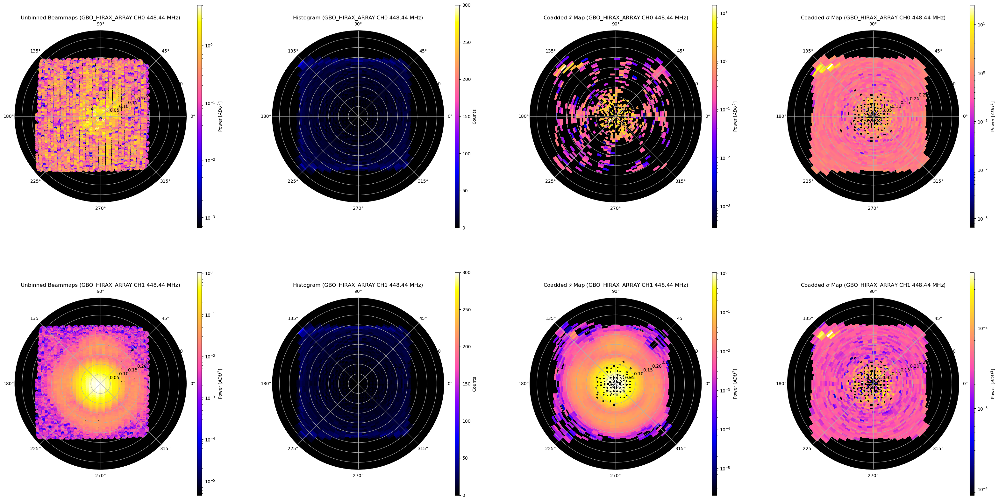

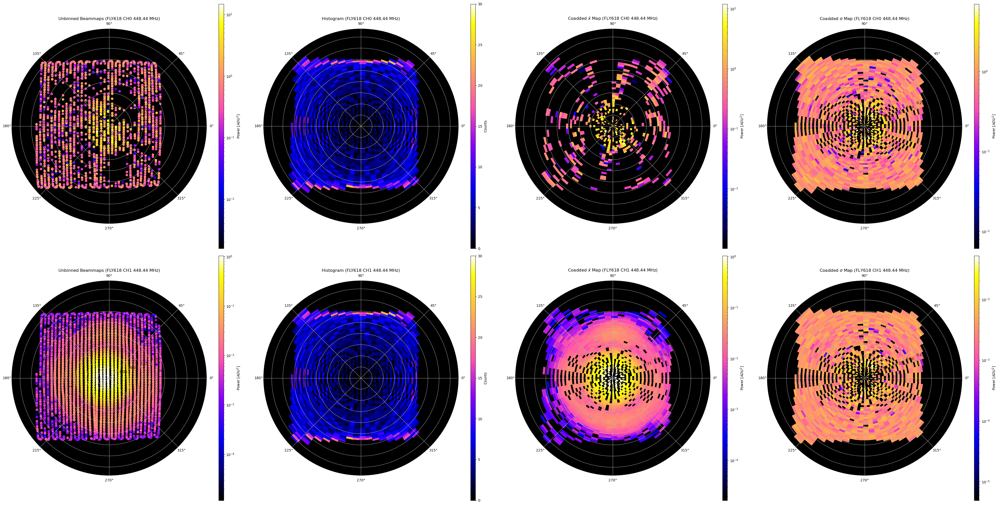

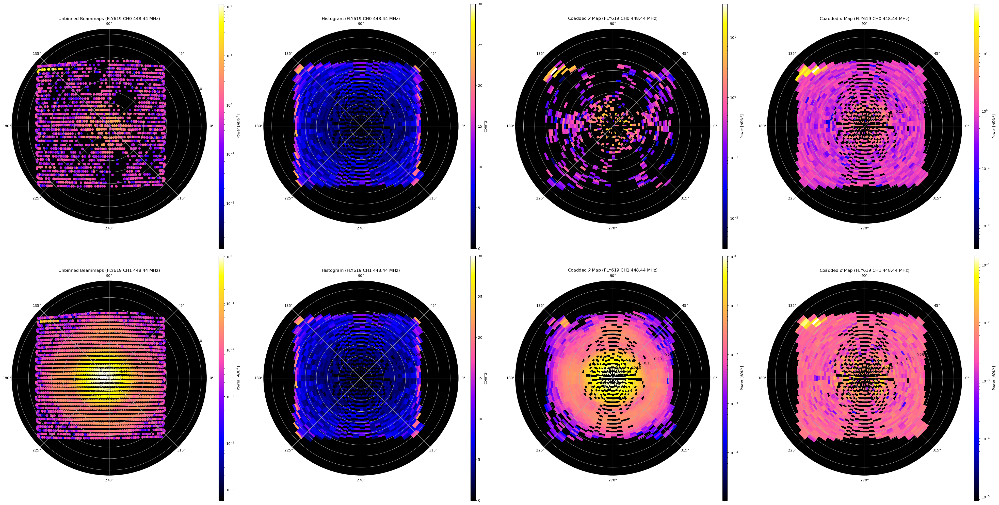

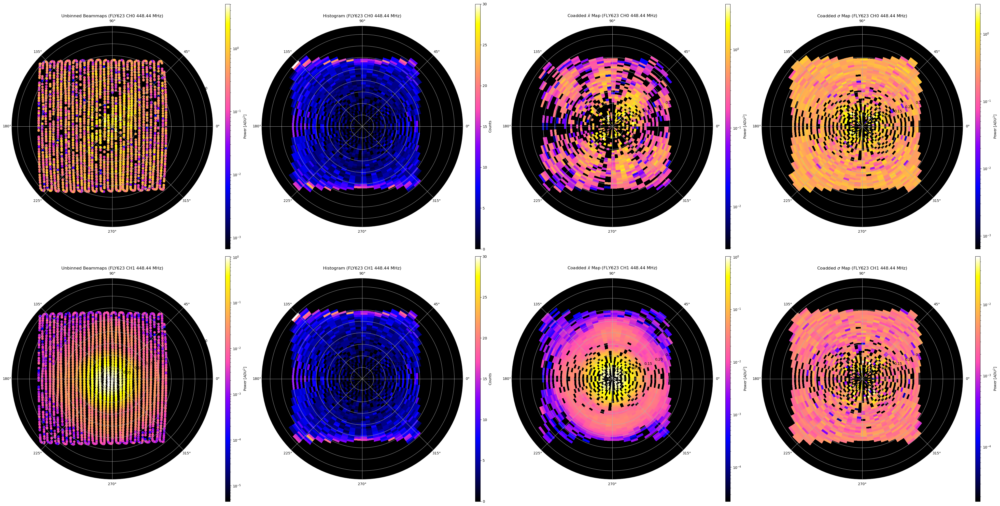

In [370]:
#testbeam_0=Beammap(concatlist=pcklarr[[1,2,11,12]],gfitlist=gfitarr[[1,2,11,12]],normalization='Gauss',operation='coadd',Xargs=[-110,110,3],Yargs=[-110,110,3])
#testbeam_1=Beammap(concatlist=pcklarr[[0,3,4,5,7,8,9,10]],gfitlist=gfitarr[[0,3,4,5,7,8,9,10]],normalization='Gauss',operation='coadd',Xargs=[-110,110,3],Yargs=[-110,110,3])
## Good resolution is [-60,60,2.5]?
testbeam=Beammap(flightmasterpath='/hirax/GBO_Analysis_Outputs/GBO_flights_forscripts.yaml',\
                 concatlist=pcklarr[[4,5,7]],gfitlist=gfitarr[[4,5,7]],normalization='Gauss',operation='coadd',\
                 #coordsys='cartesian',d0args=[-60,60,3],d1args=[-60,60,3],\
                 #coordsys='cartesian',d0args=[-60,60,2.5],d1args=[-60,60,2.5],\
                 coordsys='polar',d0args=[0,360*(np.pi/180.0),6*(np.pi/180.0)],d1args=[0,25*(np.pi/180.0),0.5*(np.pi/180.0)],\
                 #Fargs=[0,1024,1],f_index=900)\
                 Fargs=[899,901,1],f_index=900)


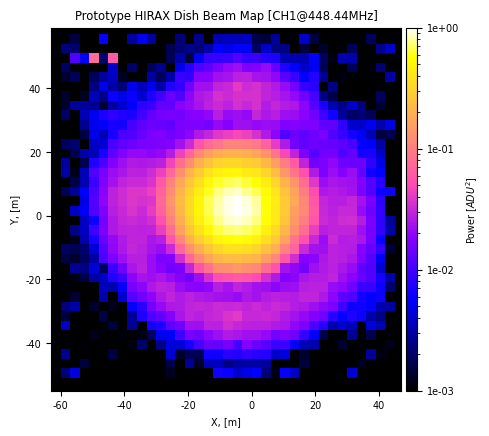

In [266]:
fig,ax1=subplots(nrows=1,ncols=1,figsize=(5,5),sharex=True,sharey=True)
ax1.set_facecolor('k')
find=1
chind=1
#ax1.scatter(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],c=np.abs(testbeam.V_LC_operation[:,:,find,1]),cmap='gnuplot2',s=5,norm=LogNorm())
im1=ax1.pcolormesh(testbeam.x_edges_grid[:,:,0],testbeam.y_edges_grid[:,:,0],(testbeam.V_LC_operation[:,:,find,chind]).T,cmap='gnuplot2',norm=LogNorm(),clim=(1e-3,1e0))
images=[im1]
cbarlabels=['Power [$ADU^2$]','Counts','Power [$ADU^2$]','Power [$ADU^2$]']
for i,ax in enumerate([ax1]):
    #ax.title(fontsize='x-small')
    ax.set_xlabel('X, [m]',fontsize='x-small')
    ax.set_xlim(-63,47)
    ax.set_ylim(-55,59)
    ax.set_xticks(ax.get_xticks()[1:-1])
    ax.set_xticklabels(ax.get_xticks().astype(int)[:],fontsize='x-small')
    ax.set_ylabel('Y, [m]',fontsize='x-small')
    ax.set_yticks(ax.get_yticks()[1:-1])
    ax.set_yticklabels(ax.get_yticks().astype(int)[:],fontsize='x-small')
    ax.set(aspect='equal')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[i],cax=cax)
    cbar.set_label(cbarlabels[i],fontsize='x-small')
    cbar.set_ticks(cbar.get_ticks().astype(float)[1:-1],labels=["{:.0e}".format(k) for k in cbar.get_ticks()[1:-1]],fontsize='x-small')
    ax.set_title('Prototype HIRAX Dish Beam Map [CH1@448.44MHz]',fontsize='small')
tight_layout()


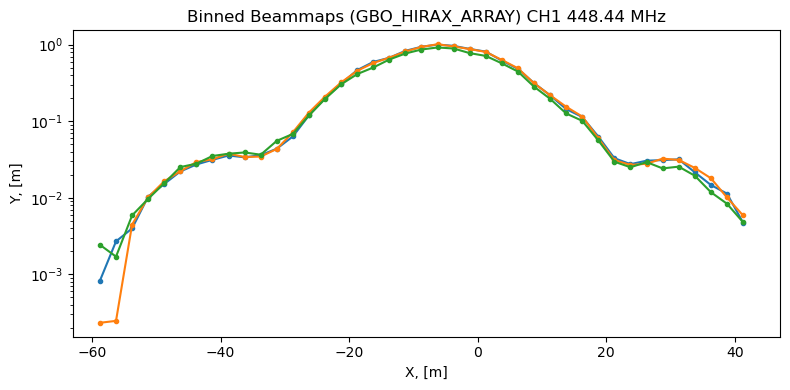

In [92]:
fig,ax1=subplots(nrows=1,ncols=1,figsize=(8,4))
find=1
chind=1
ax1.semilogy(testbeam.y_centers_grid[:,24,0],(testbeam.V_LC_operation[:,24,find,chind]),'.-')
ax1.semilogy(testbeam.y_centers_grid[:,25,0],(testbeam.V_LC_operation[:,25,find,chind]),'.-')
ax1.semilogy(testbeam.y_centers_grid[:,26,0],(testbeam.V_LC_operation[:,26,find,chind]),'.-')

for i,ax in enumerate([ax1]):
    #ax.title(fontsize='x-small')
    ax.set_xlabel('X, [m]')
    ax.set_xlim(-63,47)
    #ax.set_xticklabels(ax.get_xticks())
    #ax.set_xticks([])
    ax.set_ylabel('Y, [m]')
    #ax.set_yticklabels(ax.get_yticks())
    #ax.set_yticks([])
    #ax.set(aspect='equal')
    ax.set_title('Binned Beammaps (GBO_HIRAX_ARRAY) CH1 448.44 MHz')
tight_layout()